In [1]:
from sentence_transformers import SentenceTransformer
import numpy as np
import pandas as pd
from umap import UMAP
from hdbscan import HDBSCAN
from sklearn.feature_extraction.text import CountVectorizer
import matplotlib.pyplot as plt
import openai
from dotenv import load_dotenv # Added for .env support
load_dotenv() # Load environment variables from .env file
from bertopic.representation import KeyBERTInspired, MaximalMarginalRelevance, OpenAI, PartOfSpeech
import os

In [2]:
outdir = "v6"
os.makedirs(outdir, exist_ok=True)

In [3]:
umap_model = UMAP(n_neighbors=50, n_components=5, min_dist=0.0, metric='cosine', random_state=42)

In [4]:
hdbscan_model = HDBSCAN(min_cluster_size=50, metric="euclidean", cluster_selection_method="eom", prediction_data=True)

In [5]:
vectorizer_model = CountVectorizer(stop_words="english", min_df=2, ngram_range=(1, 2))

In [7]:
# Pre-calculate embeddings
embedding_model = SentenceTransformer("NovaSearch/stella_en_400M_v5", trust_remote_code=True)
embeddings = np.load("stella_400M_abstract.npy")

A matching Triton is not available, some optimizations will not be enabled
Traceback (most recent call last):
  File "c:\Users\SaltyWan\miniconda3\envs\pytorch\lib\site-packages\xformers\__init__.py", line 57, in _is_triton_available
    import triton  # noqa
ModuleNotFoundError: No module named 'triton'
Some weights of the model checkpoint at NovaSearch/stella_en_400M_v5 were not used when initializing NewModel: ['pooler.dense.bias', 'pooler.dense.weight']
- This IS expected if you are initializing NewModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing NewModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [8]:
keybert_model = KeyBERTInspired()

In [9]:
pos_model = PartOfSpeech("en_core_web_sm")

In [10]:
mmr_model = MaximalMarginalRelevance(diversity=0.3)

In [11]:
# Load the OpenAI client
client = openai.OpenAI()
prompt = """
I have a topic that contains the following documents:
[DOCUMENTS]
The topic is described by the following keywords: [KEYWORDS]

Based on the information above, extract a short but highly descriptive topic label of at most 5 words. Make sure it is in the following format:
topic: <topic label>
"""
openai_model = OpenAI(client, model="gpt-4o", exponential_backoff=True, prompt=prompt)

In [12]:
# All representation models
representation_model = {
    "KeyBERT": keybert_model,
    "OpenAI": openai_model,  # Uncomment if you will use OpenAI
    "MMR": mmr_model,
    "POS": pos_model
}

In [13]:
df = pd.read_csv("arxiv_csAI_minimal.csv")
abstracts = df["Abstract"].tolist()
titles = df["Title"].tolist()

In [14]:
from bertopic import BERTopic

topic_model = BERTopic(

  # Pipeline models
  embedding_model=embedding_model,
  umap_model=umap_model,
  hdbscan_model=hdbscan_model,
  vectorizer_model=vectorizer_model,
  representation_model=representation_model,

  # Hyperparameters
  top_n_words=10,
  verbose=True
)

# Train model
topics, probs = topic_model.fit_transform(abstracts, embeddings)

2025-05-11 01:33:22,666 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-05-11 01:35:48,708 - BERTopic - Dimensionality - Completed ✓
2025-05-11 01:35:48,710 - BERTopic - Cluster - Start clustering the reduced embeddings
2025-05-11 01:35:52,451 - BERTopic - Cluster - Completed ✓
2025-05-11 01:35:52,463 - BERTopic - Representation - Fine-tuning topics using representation models.
100%|██████████| 113/113 [03:34<00:00,  1.90s/it]
2025-05-11 01:52:46,027 - BERTopic - Representation - Completed ✓


In [15]:
# Show topics
topic_model.get_topic_info()

,Topic,Count,Name,Representation,KeyBERT,OpenAI,MMR,POS,Representative_Docs
0,-1,13657,-1_models_data_model_based,"[models, data, model, based, learning, languag...","[language models, ai, models llms, learning, a...",[LLMs in Decision Making Evaluation],"[model, learning, language, llms, ai, methods,...","[models, data, model, learning, language, perf...","[Although LLM-based agents, powered by Large L..."
1,0,837,0_traffic_driving_autonomous_trajectory,"[traffic, driving, autonomous, trajectory, aut...","[trajectory prediction, traffic, traffic flow,...",[Autonomous Vehicle Trajectory Prediction],"[traffic, driving, autonomous driving, road, t...","[traffic, driving, autonomous, trajectory, aut...",[Traffic prediction is one of the most signifi...
2,1,831,1_visual_multimodal_image_vision,"[visual, multimodal, image, vision, text, visi...","[vision language, language models, multimodal,...",[Multimodal Language Models Advancements],"[visual, multimodal, vision language, mllms, v...","[visual, multimodal, image, vision, text, moda...",[Recent advancements in Chain-of-Thought (CoT)...
3,2,737,2_explanations_xai_explanation_explainable,"[explanations, xai, explanation, explainable, ...","[explainable ai, explainable artificial, expla...",[Explainable AI in Decision-Making],"[explanations, xai, explainable, interpretabil...","[explanations, explanation, explainable, inter...",[Deep Neural Networks (DNNs) have revolutioniz...
4,3,659,3_protein_molecular_drug_molecules,"[protein, molecular, drug, molecules, chemical...","[drug discovery, deep learning, molecular, mol...",[Molecular Drug Discovery Methods],"[molecular, molecules, chemical, prediction, b...","[protein, molecular, drug, molecules, chemical...",[Accurate drug target affinity prediction can ...
...,...,...,...,...,...,...,...,...,...
108,107,56,107_sentiment_aspect_sarcasm_humor,"[sentiment, aspect, sarcasm, humor, absa, sent...","[aspect sentiment, sentiment analysis, aspect ...",[Aspect-Based Sentiment Analysis Advances],"[sentiment analysis, sarcasm detection, based ...","[sentiment, aspect, sarcasm, humor, irony, ana...",[Aspect-Based Sentiment Analysis (ABSA) is inc...
109,108,55,108_kd_teacher_student_distillation,"[kd, teacher, student, distillation, knowledge...","[knowledge distillation, contrastive learning,...",[Advanced Knowledge Distillation Techniques],"[kd, knowledge distillation, teacher model, di...","[teacher, student, distillation, knowledge, tr...",[Recent advances in knowledge distillation (KD...
110,109,52,109_hate_hate speech_speech_speech detection,"[hate, hate speech, speech, speech detection, ...","[hate speech, sentiment analysis, language mod...",[Hate Speech Detection Models],"[hate speech, speech detection, hateful, memes...","[hate, speech, hateful, content, detection, so...",[Although social media platforms are a promine...
111,110,52,110_chart_charts_visualization_visualizations,"[chart, charts, visualization, visualizations,...","[chartqa, chart understanding, chart, charts, ...",[Chart Comprehension and Analysis Models],"[chart, charts, visualizations, chart understa...","[chart, charts, visualization, visualizations,...",[Recent studies customizing Multimodal Large L...


In [16]:
topic_model.get_topic(1, full=True)

{'Main': [('visual', np.float64(0.01782310383717061)),
  ('multimodal', np.float64(0.015467144747823786)),
  ('image', np.float64(0.015177295007312661)),
  ('vision', np.float64(0.011666852752262011)),
  ('text', np.float64(0.011279022868393194)),
  ('vision language', np.float64(0.009980450804404316)),
  ('modal', np.float64(0.009447793888619873)),
  ('mllms', np.float64(0.009291342771594293)),
  ('vlms', np.float64(0.008871810556707684)),
  ('language', np.float64(0.008764553355422174))],
 'KeyBERT': [('vision language', np.float32(0.6057676)),
  ('language models', np.float32(0.583698)),
  ('multimodal', np.float32(0.5281745)),
  ('visual', np.float32(0.5225301)),
  ('image text', np.float32(0.5187243)),
  ('cross modal', np.float32(0.50869507)),
  ('multi modal', np.float32(0.5066052)),
  ('models mllms', np.float32(0.49944845)),
  ('multimodal large', np.float32(0.49885505)),
  ('visual question', np.float32(0.49475455))],
 'OpenAI': [('Multimodal Language Models Advancements', 1)

In [17]:
# ChatGPT's labels
chatgpt_topic_labels = {topic: " | ".join(list(zip(*values))[0]) for topic, values in topic_model.topic_aspects_["OpenAI"].items()}
# chatgpt_topic_labels[-1] = "Outlier Topic"
topic_model.set_topic_labels(chatgpt_topic_labels)

In [18]:
topic_model.get_topic_info()

,Topic,Count,Name,CustomName,Representation,KeyBERT,OpenAI,MMR,POS,Representative_Docs
0,-1,13657,-1_models_data_model_based,LLMs in Decision Making Evaluation,"[models, data, model, based, learning, languag...","[language models, ai, models llms, learning, a...",[LLMs in Decision Making Evaluation],"[model, learning, language, llms, ai, methods,...","[models, data, model, learning, language, perf...","[Although LLM-based agents, powered by Large L..."
1,0,837,0_traffic_driving_autonomous_trajectory,Autonomous Vehicle Trajectory Prediction,"[traffic, driving, autonomous, trajectory, aut...","[trajectory prediction, traffic, traffic flow,...",[Autonomous Vehicle Trajectory Prediction],"[traffic, driving, autonomous driving, road, t...","[traffic, driving, autonomous, trajectory, aut...",[Traffic prediction is one of the most signifi...
2,1,831,1_visual_multimodal_image_vision,Multimodal Language Models Advancements,"[visual, multimodal, image, vision, text, visi...","[vision language, language models, multimodal,...",[Multimodal Language Models Advancements],"[visual, multimodal, vision language, mllms, v...","[visual, multimodal, image, vision, text, moda...",[Recent advancements in Chain-of-Thought (CoT)...
3,2,737,2_explanations_xai_explanation_explainable,Explainable AI in Decision-Making,"[explanations, xai, explanation, explainable, ...","[explainable ai, explainable artificial, expla...",[Explainable AI in Decision-Making],"[explanations, xai, explainable, interpretabil...","[explanations, explanation, explainable, inter...",[Deep Neural Networks (DNNs) have revolutioniz...
4,3,659,3_protein_molecular_drug_molecules,Molecular Drug Discovery Methods,"[protein, molecular, drug, molecules, chemical...","[drug discovery, deep learning, molecular, mol...",[Molecular Drug Discovery Methods],"[molecular, molecules, chemical, prediction, b...","[protein, molecular, drug, molecules, chemical...",[Accurate drug target affinity prediction can ...
...,...,...,...,...,...,...,...,...,...,...
108,107,56,107_sentiment_aspect_sarcasm_humor,Aspect-Based Sentiment Analysis Advances,"[sentiment, aspect, sarcasm, humor, absa, sent...","[aspect sentiment, sentiment analysis, aspect ...",[Aspect-Based Sentiment Analysis Advances],"[sentiment analysis, sarcasm detection, based ...","[sentiment, aspect, sarcasm, humor, irony, ana...",[Aspect-Based Sentiment Analysis (ABSA) is inc...
109,108,55,108_kd_teacher_student_distillation,Advanced Knowledge Distillation Techniques,"[kd, teacher, student, distillation, knowledge...","[knowledge distillation, contrastive learning,...",[Advanced Knowledge Distillation Techniques],"[kd, knowledge distillation, teacher model, di...","[teacher, student, distillation, knowledge, tr...",[Recent advances in knowledge distillation (KD...
110,109,52,109_hate_hate speech_speech_speech detection,Hate Speech Detection Models,"[hate, hate speech, speech, speech detection, ...","[hate speech, sentiment analysis, language mod...",[Hate Speech Detection Models],"[hate speech, speech detection, hateful, memes...","[hate, speech, hateful, content, detection, so...",[Although social media platforms are a promine...
111,110,52,110_chart_charts_visualization_visualizations,Chart Comprehension and Analysis Models,"[chart, charts, visualization, visualizations,...","[chartqa, chart understanding, chart, charts, ...",[Chart Comprehension and Analysis Models],"[chart, charts, visualizations, chart understa...","[chart, charts, visualization, visualizations,...",[Recent studies customizing Multimodal Large L...


In [19]:
# Reduce outliers with pre-calculate embeddings instead
new_topics = topic_model.reduce_outliers(abstracts, topics, strategy="embeddings", embeddings=embeddings)
topic_model.update_topics(abstracts, topics=new_topics)

2025-05-11 01:52:52,752 - BERTopic - WARNING: Using a custom list of topic assignments may lead to errors if topic reduction techniques are used afterwards. Make sure that manually assigning topics is the last step in the pipeline.Note that topic embeddings will also be created through weightedc-TF-IDF embeddings instead of centroid embeddings.


In [20]:
# ChatGPT's labels
chatgpt_topic_labels = {topic: " | ".join(list(zip(*values))[0]) for topic, values in topic_model.topic_aspects_["OpenAI"].items()}
# chatgpt_topic_labels[-1] = "Outlier Topic"
topic_model.set_topic_labels(chatgpt_topic_labels)

In [21]:
topic_info = topic_model.get_topic_info()
topic_info.to_csv(f"{outdir}/topic_info.csv", index=False)
topic_info

,Topic,Count,Name,CustomName,Representation,KeyBERT,OpenAI,MMR,POS,Representative_Docs
0,0,894,0_traffic_driving_autonomous_trajectory,Autonomous Vehicle Trajectory Prediction,"[traffic, driving, autonomous, trajectory, veh...","[trajectory prediction, traffic, traffic flow,...",[Autonomous Vehicle Trajectory Prediction],"[traffic, driving, autonomous driving, road, t...","[traffic, driving, autonomous, trajectory, aut...",[Traffic prediction is one of the most signifi...
1,1,1211,1_visual_image_multimodal_vision,Multimodal Language Models Advancements,"[visual, image, multimodal, vision, text, moda...","[vision language, language models, multimodal,...",[Multimodal Language Models Advancements],"[visual, multimodal, vision language, mllms, v...","[visual, multimodal, image, vision, text, moda...",[Recent advancements in Chain-of-Thought (CoT)...
2,2,858,2_explanations_xai_explanation_interpretability,Explainable AI in Decision-Making,"[explanations, xai, explanation, interpretabil...","[explainable ai, explainable artificial, expla...",[Explainable AI in Decision-Making],"[explanations, xai, explainable, interpretabil...","[explanations, explanation, explainable, inter...",[Deep Neural Networks (DNNs) have revolutioniz...
3,3,680,3_protein_molecular_drug_molecules,Molecular Drug Discovery Methods,"[protein, molecular, drug, molecules, chemical...","[drug discovery, deep learning, molecular, mol...",[Molecular Drug Discovery Methods],"[molecular, molecules, chemical, prediction, b...","[protein, molecular, drug, molecules, chemical...",[Accurate drug target affinity prediction can ...
4,4,674,4_federated_fl_clients_privacy,Personalized Federated Learning Techniques,"[federated, fl, clients, privacy, client, lear...","[federated learning, federated, model training...",[Personalized Federated Learning Techniques],"[federated, fl, federated learning, privacy, c...","[federated, clients, privacy, client, learning...",[Federated Learning (FL) offers a privacy-pres...
...,...,...,...,...,...,...,...,...,...,...
107,107,123,107_sentiment_aspect_sarcasm_humor,Aspect-Based Sentiment Analysis Advances,"[sentiment, aspect, sarcasm, humor, analysis, ...","[aspect sentiment, sentiment analysis, aspect ...",[Aspect-Based Sentiment Analysis Advances],"[sentiment analysis, sarcasm detection, based ...","[sentiment, aspect, sarcasm, humor, irony, ana...",[Aspect-Based Sentiment Analysis (ABSA) is inc...
108,108,105,108_distillation_teacher_student_kd,Advanced Knowledge Distillation Techniques,"[distillation, teacher, student, kd, knowledge...","[knowledge distillation, contrastive learning,...",[Advanced Knowledge Distillation Techniques],"[kd, knowledge distillation, teacher model, di...","[teacher, student, distillation, knowledge, tr...",[Recent advances in knowledge distillation (KD...
109,109,129,109_hate_social_media_speech,Hate Speech Detection Models,"[hate, social, media, speech, content, toxicit...","[hate speech, sentiment analysis, language mod...",[Hate Speech Detection Models],"[hate speech, speech detection, hateful, memes...","[hate, speech, hateful, content, detection, so...",[Although social media platforms are a promine...
110,110,89,110_chart_charts_visualization_visualizations,Chart Comprehension and Analysis Models,"[chart, charts, visualization, visualizations,...","[chartqa, chart understanding, chart, charts, ...",[Chart Comprehension and Analysis Models],"[chart, charts, visualizations, chart understa...","[chart, charts, visualization, visualizations,...",[Recent studies customizing Multimodal Large L...


In [22]:
fig = topic_model.visualize_barchart()
fig.write_html(f"{outdir}/barchart.html")
# fig.write_image(f"{outdir}/barchart.png", format="png")
fig

In [23]:
fig = topic_model.visualize_hierarchy(custom_labels=True)
# save the figure
fig.write_html(f"{outdir}/hierarchy.html")
# fig.write_image(f"{outdir}/hierarchy.png")
fig

In [24]:
fig = topic_model.visualize_topics(custom_labels=True)
# save the figure
fig.write_html(f"{outdir}/intertopics.html")
# fig.write_image(f"{outdir}/intertopics.png")
fig

In [25]:
reduced_embeddings = UMAP(n_neighbors=10, n_components=2, min_dist=0.0, metric='cosine').fit_transform(embeddings)

In [26]:
vis_docs = topic_model.visualize_documents(titles, reduced_embeddings=reduced_embeddings, custom_labels=True)
# save the figure
vis_docs.write_html(f"{outdir}/documents.html")
# vis_docs.write_image(f"{outdir}/documents.png")
vis_docs

In [27]:
fig = topic_model.visualize_documents(titles, reduced_embeddings=reduced_embeddings, custom_labels=True, hide_annotations=True)
# save the figure
fig.write_html(f"{outdir}/documents_no_annotations.html")
# fig.write_image(f"{outdir}/documents_no_annotations.png")
fig.show()

In [28]:
timestamps = pd.to_datetime(df["Submission Date"], format="%Y-%m-%d")
# timestamps = timestamps.dt.month
# convert timestamp to Month-Year format
timestamps = timestamps.dt.strftime("%Y-%m")
# convert timestamp to Year month week format
# timestamps = timestamps.dt.strftime("%Y-%m-%W")
# Quarterly format
# timestamps = timestamps.dt.to_period("Q").dt.start_time
# convert timestamp to Year-Quarter format
# timestamps = timestamps.dt.strftime("%Y-%q")
# convert timestamp to Year-Week format
# convert timestamp to Year format
# timestamps = timestamps.dt.strftime("%Y")
topics_over_time = topic_model.topics_over_time(abstracts, timestamps)

13it [00:26,  2.04s/it]


In [29]:
topics_over_time.to_csv(f"{outdir}/topics_over_time.csv", index=False)
topics_over_time

,Topic,Words,Frequency,Timestamp
0,0,"driving, traffic, autonomous, trajectory, vehi...",65,2024-03-01
1,1,"visual, image, vision, multimodal, text",95,2024-03-01
2,2,"explanations, xai, explanation, explainability...",62,2024-03-01
3,3,"molecular, protein, drug, molecules, chemical",33,2024-03-01
4,4,"federated, fl, clients, privacy, client",40,2024-03-01
...,...,...,...,...
1451,107,"sarcasm, sd, detection, stance, sentiment",5,2025-03-01
1452,108,"distillation, teacher, student, ddif, kd",6,2025-03-01
1453,109,"hate, moderation, toxicity, toxic, moderators",6,2025-03-01
1454,110,"chart, visualization, visualizations, charts, ...",12,2025-03-01


In [30]:
fig = topic_model.visualize_topics_over_time(topics_over_time, custom_labels=True, top_n_topics=10, height=720, width=1280)
# save the figure
fig.write_html(f"{outdir}/topics_over_time.html")
# fig.write_image(f"{outdir}/topics_over_time.png")
fig.show()

In [32]:
# get the topic of each document
docs_info = topic_model.get_document_info(abstracts)
docs_info.to_csv(f"{outdir}/docs_info.csv", index=False)
docs_info

,Document,Topic,Name,CustomName,Representation,KeyBERT,OpenAI,MMR,POS,Representative_Docs,Top_n_words,Probability,Representative_document
0,State-of-the-art language model fine-tuning te...,84,84_safety_unsafe_llms_alignment,LLM Safety Alignment Challenges,"[safety, unsafe, llms, alignment, harmful, saf...","[safety alignment, safety aligned, model safet...",[LLM Safety Alignment Challenges],"[safety alignment, alignment, unsafe, safe, la...","[safety, alignment, unsafe, refusal, harmful, ...",[Safety alignment is an important procedure be...,safety - unsafe - llms - alignment - harmful -...,1.000000,False
1,Multi-hop question answering (MQA) under knowl...,13,13_series_time_forecasting_temporal,Time Series Forecasting Models,"[series, time, forecasting, temporal, multivar...","[time series, series forecasting, multivariate...",[Time Series Forecasting Models],"[time series, series forecasting, temporal, se...","[series, time, forecasting, temporal, multivar...",[This technical report describes the Time Seri...,series - time - forecasting - temporal - multi...,0.214415,False
2,Large Language Models (LLMs) have shown except...,51,51_instruction_prompt_llms_instructions,Instruction Following in LLMs,"[instruction, prompt, llms, instructions, tuni...","[language models, instruction following, instr...",[Instruction Following in LLMs],"[instructions, prompts, synthetic data, follow...","[instruction, instructions, prompt, prompts, s...",[Instruction fine-tuning is crucial for today'...,instruction - prompt - llms - instructions - t...,0.000000,False
3,A visually rich document (VRD) utilizes visual...,83,83_entity_extraction_relation_ner,Advanced Named Entity Recognition,"[entity, extraction, relation, ner, entities, ...","[entity recognition, relation extraction, enti...",[Advanced Named Entity Recognition],"[relation, relation extraction, ner, entities,...","[entity, relation, extraction, entities, relat...","[This paper presents ReverseNER, a method aime...",entity - extraction - relation - ner - entitie...,1.000000,False
4,MindScape aims to study the benefits of integr...,45,45_mental_health_depression_psychological,AI-Driven Mental Health Solutions,"[mental, health, depression, psychological, su...","[mental health, language models, mental, psych...",[AI-Driven Mental Health Solutions],"[mental, mental health, depression, psychologi...","[mental, mental health, health, depression, ps...","[We present TheraGen, an advanced AI-powered m...",mental - health - depression - psychological -...,0.545057,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
36580,"In this work, we introduce a novel problem set...",49,49_domain_data_label_learning,Heterogeneous Domain Adaptation Techniques,"[domain, data, label, learning, labels, class,...","[domain adaptation, domain generalization, uns...",[Heterogeneous Domain Adaptation Techniques],"[unlabeled, class, samples, domain adaptation,...","[domain, unlabeled, class, samples, data, lear...",[Unsupervised Domain Adaptation (UDA) aims to ...,domain - data - label - learning - labels - cl...,1.000000,False
36581,Large language models (LLMs) hold substantial ...,72,72_hallucination_hallucinations_llms_factual,Hallucination Detection in LLMs,"[hallucination, hallucinations, llms, factual,...","[hallucinations llms, llm hallucinations, hall...",[Hallucination Detection in LLMs],"[hallucination detection, large language, mode...","[hallucination, hallucinations, factual, detec...",[Summarization is one of the most common tasks...,hallucination - hallucinations - llms - factua...,0.562677,False
36582,The black-box nature of neural networks limits...,32,32_neural_physics_equations_physical,Neural Networks for Differential Equations,"[neural, physics, equations, physical, differe...","[neural odes, neural networks, neural network,...",[Neural Networks for Differential Equations],"[neural, pdes, differential equations, physics...","[neural, equations, physics, differential, dif...",[Deep mod

<InteractiveFigure width=1200 height=750>
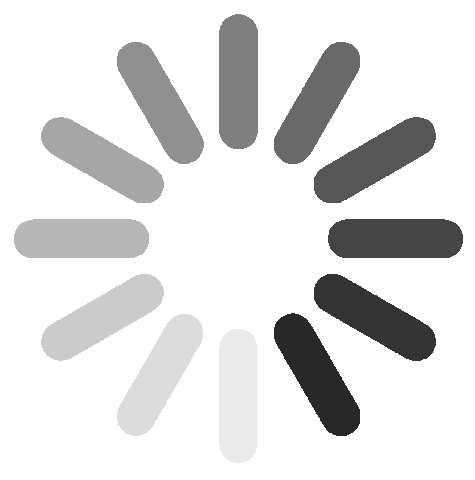

In [35]:
fig = topic_model.visualize_document_datamap(titles, reduced_embeddings=reduced_embeddings, embeddings=embeddings, custom_labels=True, interactive=True, enable_search=True)
# save the figure
fig.save(f"{outdir}/document_datamap.html")
fig

In [36]:
embedding_model = "NovaSearch/stella_en_400M_v5"
topic_model.save("my_model_dirv6", serialization="safetensors", save_ctfidf=True, save_embedding_model=embedding_model)